In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np 
import matplotlib.pyplot as plt

from layers import SeluConv3D, SeluDense

import tensorflow as tf
tf.config.list_physical_devices('GPU')

[]

In [2]:
from data import tfrecord_labeled_dataset, tfrecord_dataset, train_test_split, kfolds
from config import (
    CT_0_TFRECORD,
    CT_1_TFRECORD,
    CT_2_TFRECORD,
    CT_3_TFRECORD,
    CT_4_TFRECORD,
    COVID_NEG_TFRECORD,
    COVID_POS_TFRECORD,
    SCAN_SHAPE,
    LIDC_NUM_NODULES_TFRECORD,
)

data_pretraining, data_pretraining_test = train_test_split(tfrecord_labeled_dataset(LIDC_NUM_NODULES_TFRECORD))
data_covid_neg, data_covid_neg_test   = train_test_split(tfrecord_dataset(COVID_NEG_TFRECORD))
data_covid_pos, data_covid_pos_test   = train_test_split(tfrecord_dataset(COVID_POS_TFRECORD))

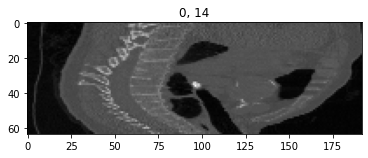

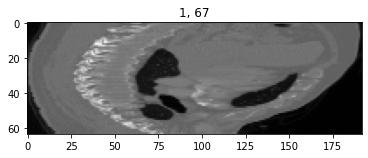

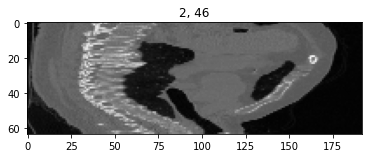

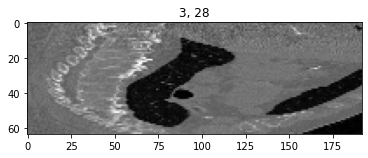

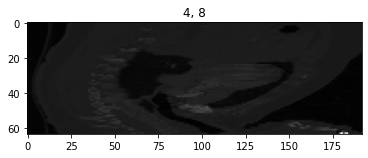

...

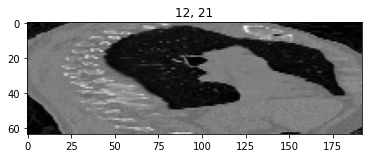

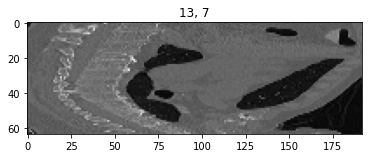

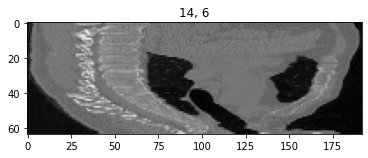

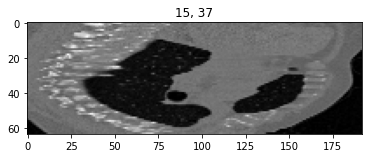

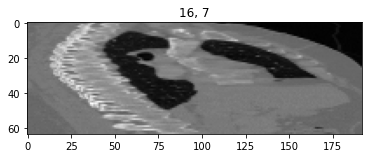

In [61]:
elements   = [element for element, _ in data_pretraining.as_numpy_iterator()]
all_labels = [label for _, label in data_pretraining.as_numpy_iterator()]
for iElement, (element, label) in enumerate(data_pretraining.as_numpy_iterator()):
    plt.imshow (element[:,::-1,100,0])
    plt.title ( "%d, %d" % (iElement, int(label)) )
    plt.show()
    if iElement > 15: break
        
np.savez("exported_dataset.npz", data = np.array(elements), labels = np.array(all_labels).reshape(-1))

<Figure size 432x288 with 0 Axes>

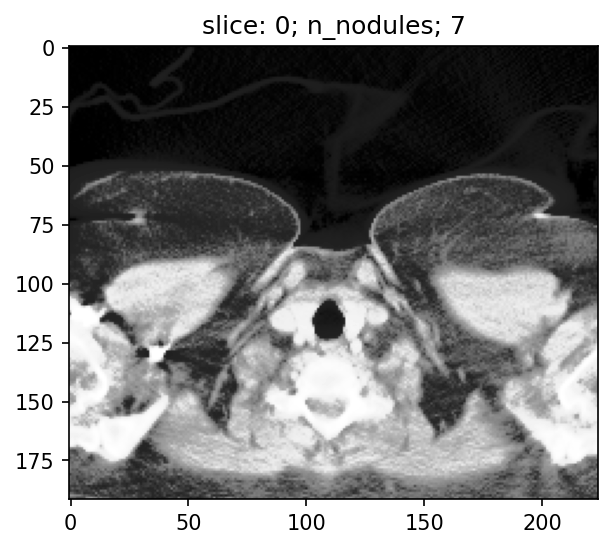

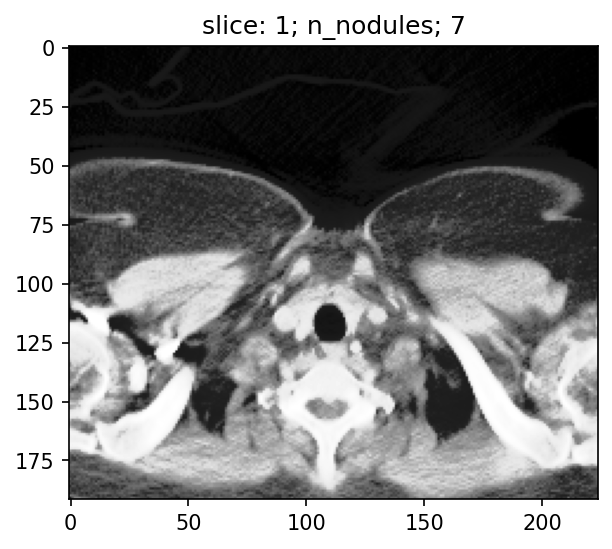

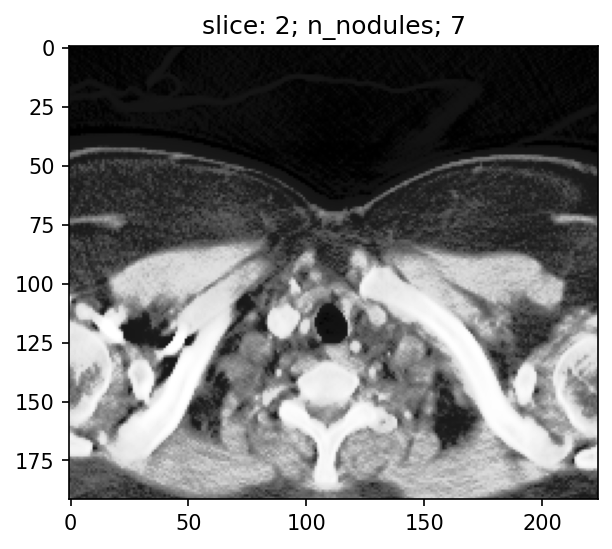

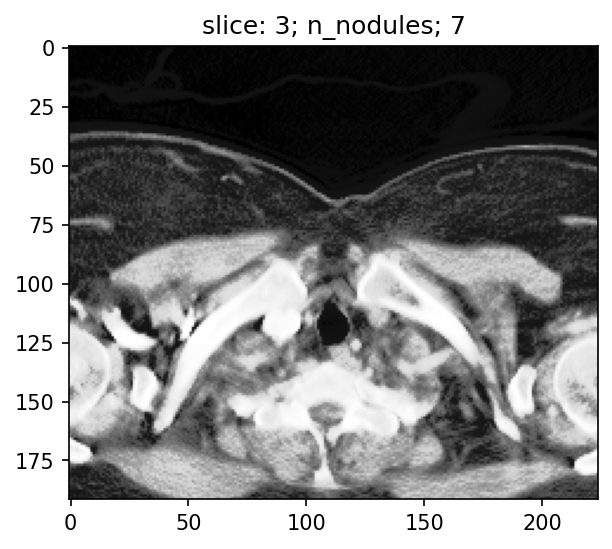

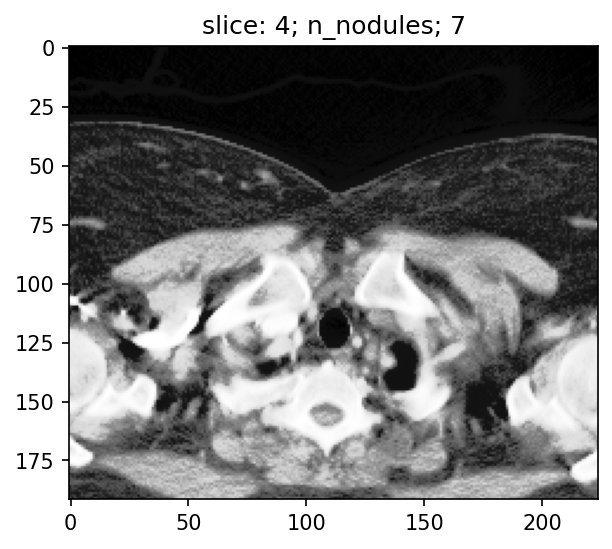

...

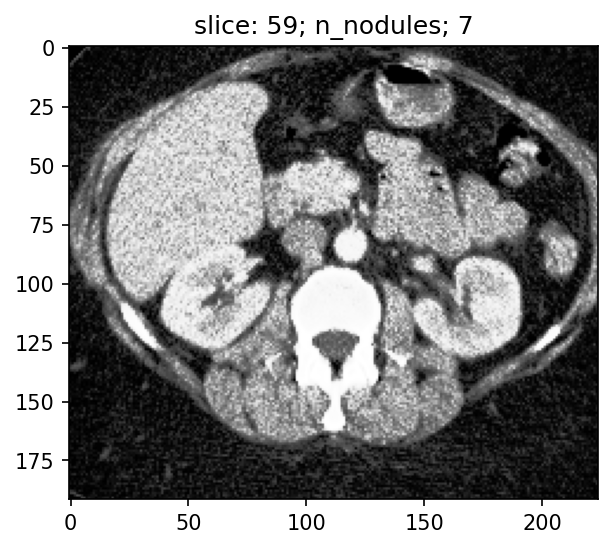

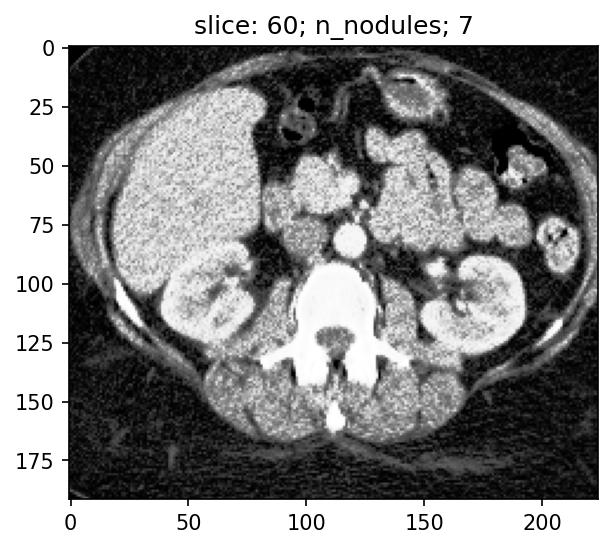

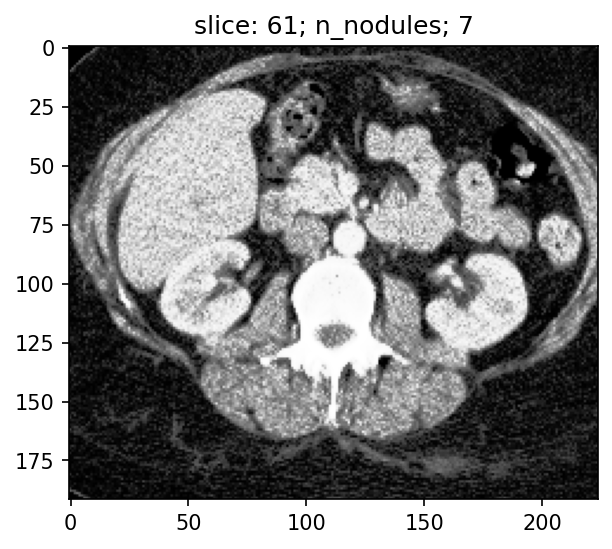

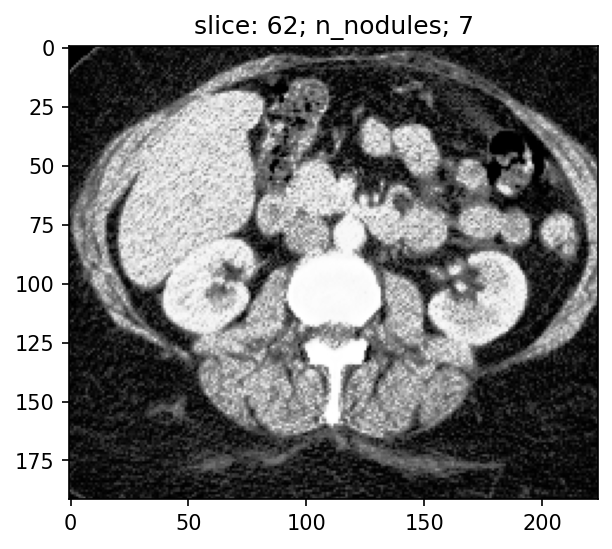

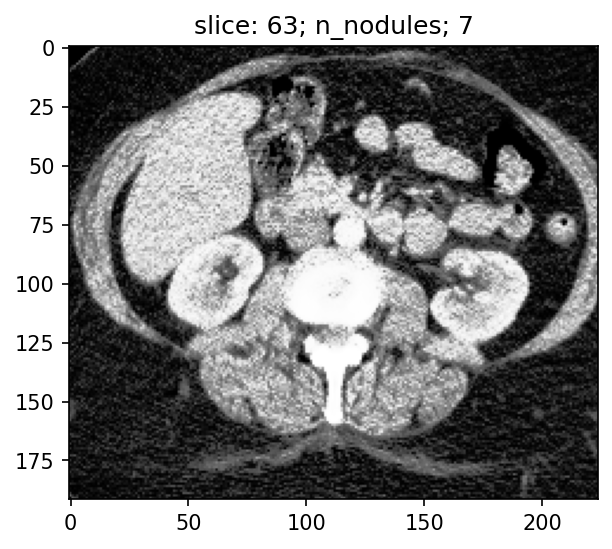

In [60]:
index = 16
element = elements[index]
n_nodules = all_labels[index]
plt.gray()

from sklearn.preprocessing import QuantileTransformer
    
def scaler (x):
    qt = QuantileTransformer()
    raw = qt.fit_transform ( x.reshape((-1,1))).reshape(x.shape)
    return 1/(1+np.exp(-(raw-0.7)/0.2))
#scaler = lambda x: (x - x.min())/(x.max()-x.min())

for iSlice, slice_ in enumerate(element):
    plt.figure ( dpi = 150 )
    plt.title ( "slice: %d; n_nodules; %d" % (iSlice, n_nodules) ) 
    plt.imshow (scaler(slice_))
    plt.show()


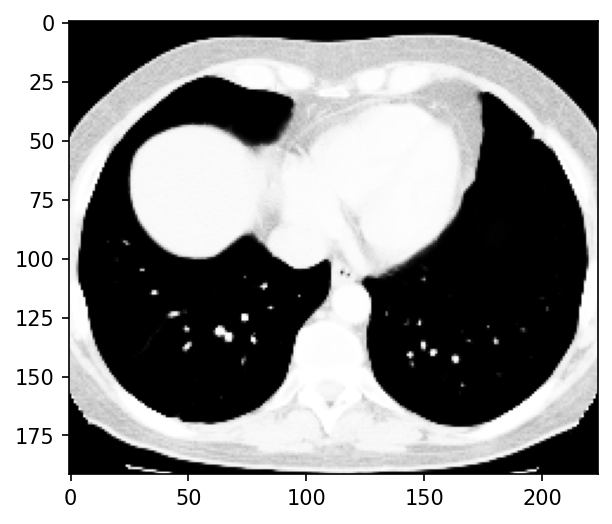

In [44]:
slice_ = element[26]
window = lambda x: 1/(1+np.exp(-(x-0.6)/0.02))
figure = plt.figure(dpi=150)
plt.imshow ( window (scaler(slice_)) )
plt.show()